In [1]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import pickle 
import numpy as np
import pandas as pd
import plotly.express as px


c:\Users\Maods\.virtualenvs\retrieval_loss-nPvXmFx2\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def create_static_2d_plot(data,labels):

    # Perform PCA for dimensionality reduction
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(data)

    # Perform t-SNE for dimensionality reduction
    tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
    tsne_result = tsne.fit_transform(data)

    # Perform UMAP for dimensionality reduction
    umap_reducer = umap.UMAP(n_components=2)
    umap_result = umap_reducer.fit_transform(data)

    # Create a figure with subplots for each method
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot PCA clusters
    axes[0].scatter(pca_result[:, 0], pca_result[:, 1], c=labels, cmap='viridis', s=10)
    axes[0].set_title('PCA')
    axes[0].axis('off')

    # Plot t-SNE clusters
    axes[1].scatter(tsne_result[:, 0], tsne_result[:, 1], c=labels, cmap='viridis', s=10)
    axes[1].set_title('t-SNE')
    axes[1].axis('off')

    # Plot UMAP clusters
    axes[2].scatter(umap_result[:, 0], umap_result[:, 1], c=labels, cmap='viridis', s=10)
    axes[2].set_title('UMAP')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

In [3]:
def create_static_3d_plot(data,labels):
    
    

    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(data)

    # Perform t-SNE for dimensionality reduction
    tsne = TSNE(n_components=3, perplexity=30, n_iter=300)
    tsne_result = tsne.fit_transform(data)

    # Perform UMAP for dimensionality reduction
    umap_reducer = umap.UMAP(n_components=3)
    umap_result = umap_reducer.fit_transform(data)

    # Create a 3D scatter plot for each method
    fig = plt.figure(figsize=(18, 6))

    # Plot PCA clusters in 3D
    ax1 = fig.add_subplot(131, projection='3d')
    ax1.scatter(pca_result[:, 0], pca_result[:, 1], pca_result[:, 2], c=labels, cmap='viridis', s=10)
    ax1.set_title('PCA')

    # Plot t-SNE clusters in 3D
    ax2 = fig.add_subplot(132, projection='3d')
    ax2.scatter(tsne_result[:, 0], tsne_result[:, 1], tsne_result[:, 2], c=labels, cmap='viridis', s=10)
    ax2.set_title('t-SNE')

    # Plot UMAP clusters in 3D
    ax3 = fig.add_subplot(133, projection='3d')
    ax3.scatter(umap_result[:, 0], umap_result[:, 1], umap_result[:, 2], c=labels, cmap='viridis', s=10)
    ax3.set_title('UMAP')

    plt.tight_layout()
    plt.show()
    return pca_result, tsne_result, umap_result

In [4]:
def create_din_3d_plot(data, result, title):
    df = {
        "dim_1": data[:, 0],
        "dim_2": data[:, 1],
        "dim_3": data[:, 2],
        "labels": result['classes'],
        "id":result['paths']
    }

    df = pd.DataFrame(df)
    fig = px.scatter_3d(data_frame=df, x='dim_1', y='dim_2', z='dim_3', color='labels', title=title, width=500, height=500)
    fig.update_traces(marker=dict(size=1))
    # fig.update_traces(customdata=df['id'])
    # fig.update_traces(hovertemplate="<b>Point ID: %{customdata}</b>")
    # fig.update_layout(scene=dict(pixel_ratio=2))
    fig.show()

In [5]:
def load_embeddings(pickle_file_path):
    with open(pickle_file_path, 'rb') as pickle_file:
        loaded_data_dict = pickle.load(pickle_file)

    # Convert lists to numpy arrays
    data = loaded_data_dict["embedding"]
    labels = np.array(loaded_data_dict["target"])
    return data, labels, loaded_data_dict

    

In [6]:
# [i.split('/')[0] for i in result['paths']]

# Semantic Attributes

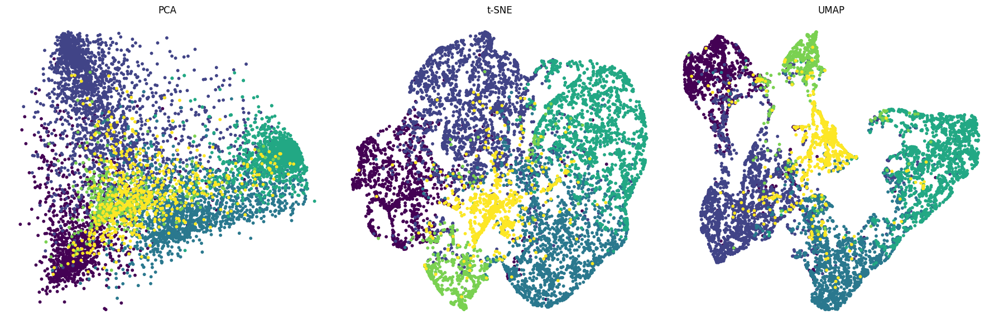

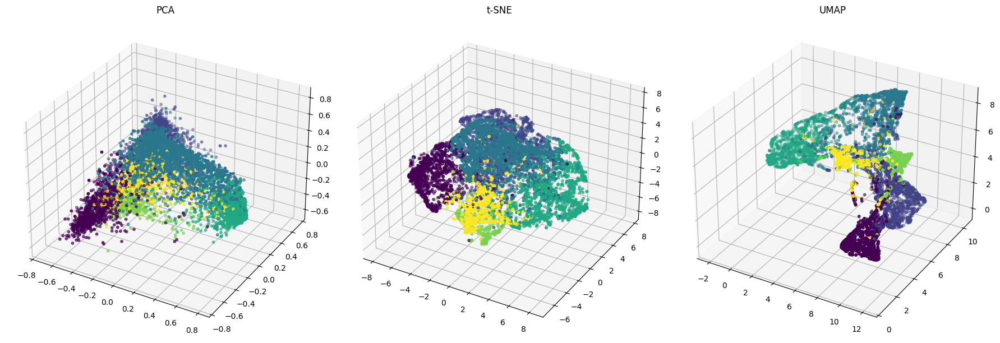

In [7]:
path = './data_embeddings/semantic/semantic_train.pickle'

data, labels, result = load_embeddings(path)

create_static_2d_plot(data,labels)
pca_result, tsne_result, umap_result = create_static_3d_plot(data,labels)

create_din_3d_plot(pca_result, result, 'PCA Clusters')
create_din_3d_plot(tsne_result, result, 't-SNE Clusters')
create_din_3d_plot(umap_result, result, 'UMAP Clusters')

# Binary Model Embeddings: Normal Glomeruli 

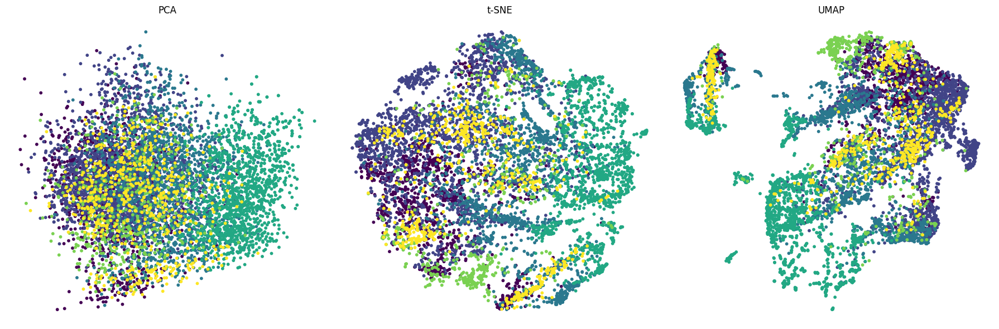

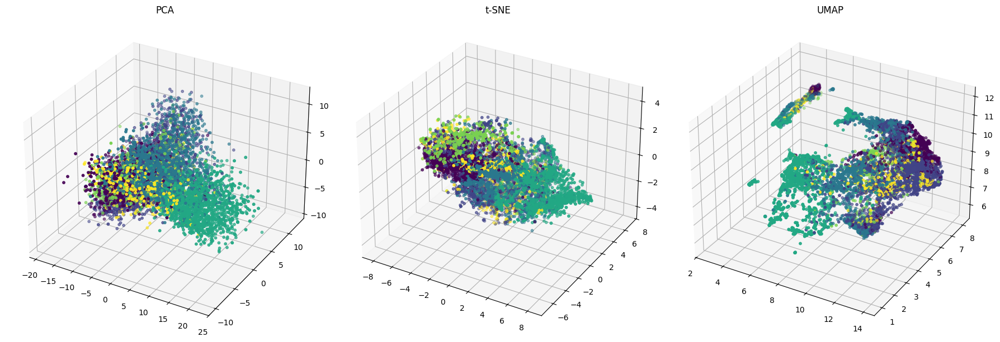

In [8]:
path = './binary_normal_train_data_embeddings.pickle'

data, labels, result = load_embeddings(path)

create_static_2d_plot(data,labels)
pca_result, tsne_result, umap_result = create_static_3d_plot(data,labels)

create_din_3d_plot(pca_result, result, 'PCA Clusters')
create_din_3d_plot(tsne_result, result, 't-SNE Clusters')
create_din_3d_plot(umap_result, result, 'UMAP Clusters')

# Binary Model Embeddings: Hypercellularity Glomeruli 

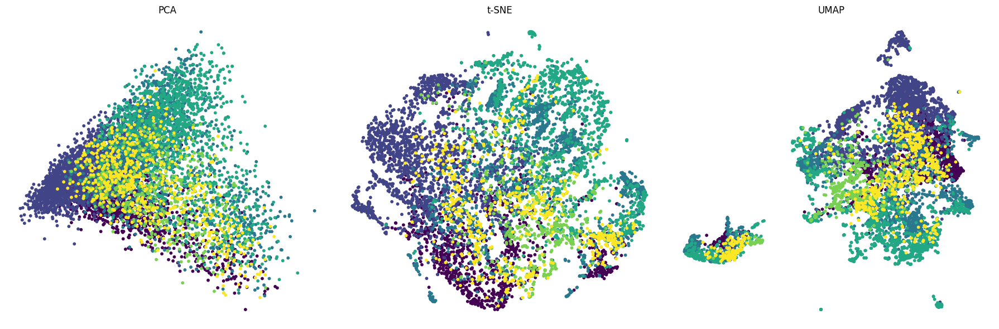

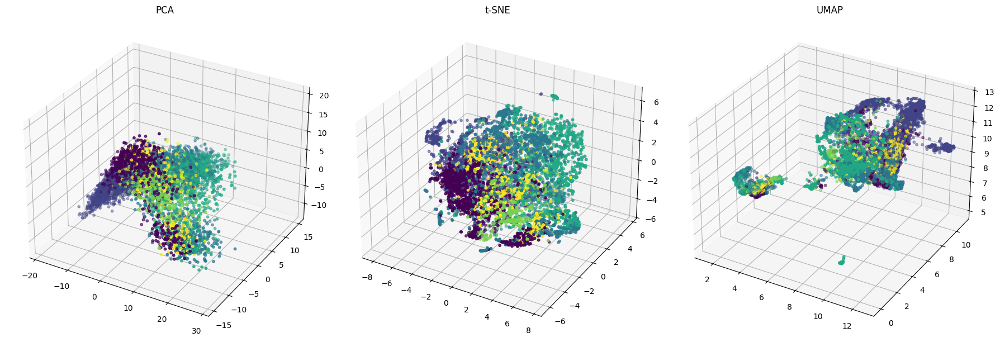

In [9]:
path = './binary_hypercellularity_train_data_embeddings.pickle'

data, labels, result = load_embeddings(path)

create_static_2d_plot(data,labels)
pca_result, tsne_result, umap_result = create_static_3d_plot(data,labels)

create_din_3d_plot(pca_result, result, 'PCA Clusters')
create_din_3d_plot(tsne_result, result, 't-SNE Clusters')
create_din_3d_plot(umap_result, result, 'UMAP Clusters')

# Binary Model Embeddings: Membranous Glomeruli 

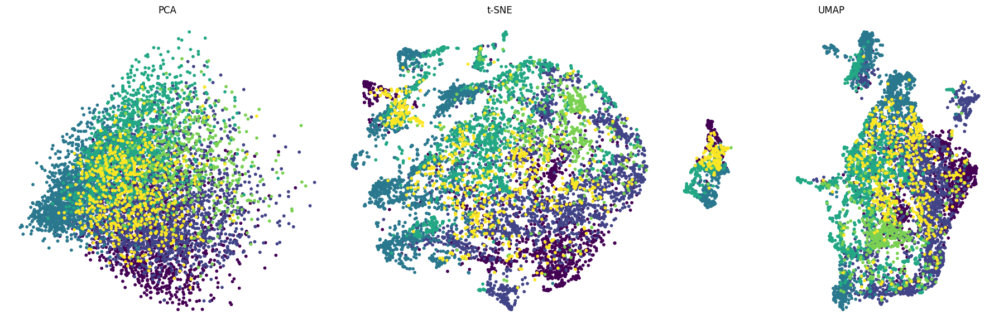

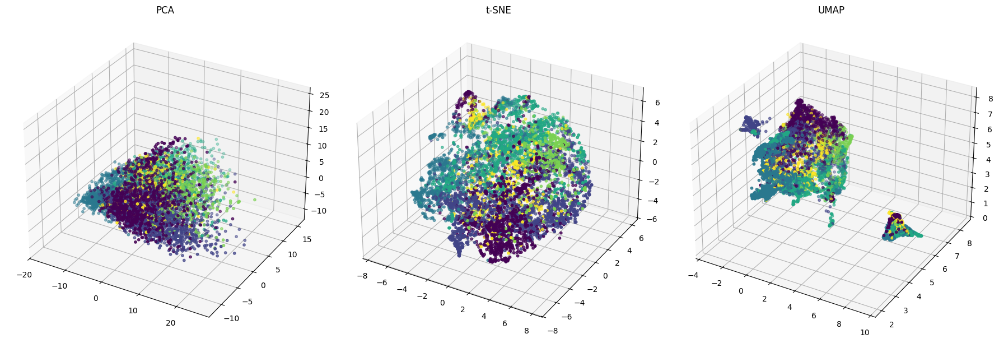

In [10]:
path = './binary_membranous_train_data_embeddings.pickle'

data, labels, result = load_embeddings(path)

create_static_2d_plot(data,labels)
pca_result, tsne_result, umap_result = create_static_3d_plot(data,labels)

create_din_3d_plot(pca_result, result, 'PCA Clusters')
create_din_3d_plot(tsne_result, result, 't-SNE Clusters')
create_din_3d_plot(umap_result, result, 'UMAP Clusters')